In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [6]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"/workstation/genesys_model_trained_on_root_atlas_20240308_continue4.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [7]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [8]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [9]:
## GRN for the transition t1 to t3
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 2).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast
Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [10]:
# Save the array to disk
np.save('genesys_ctw_t1-t3.npy', ctw)

In [11]:
ctw = np.load('genesys_ctw_t1-t3.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [18]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

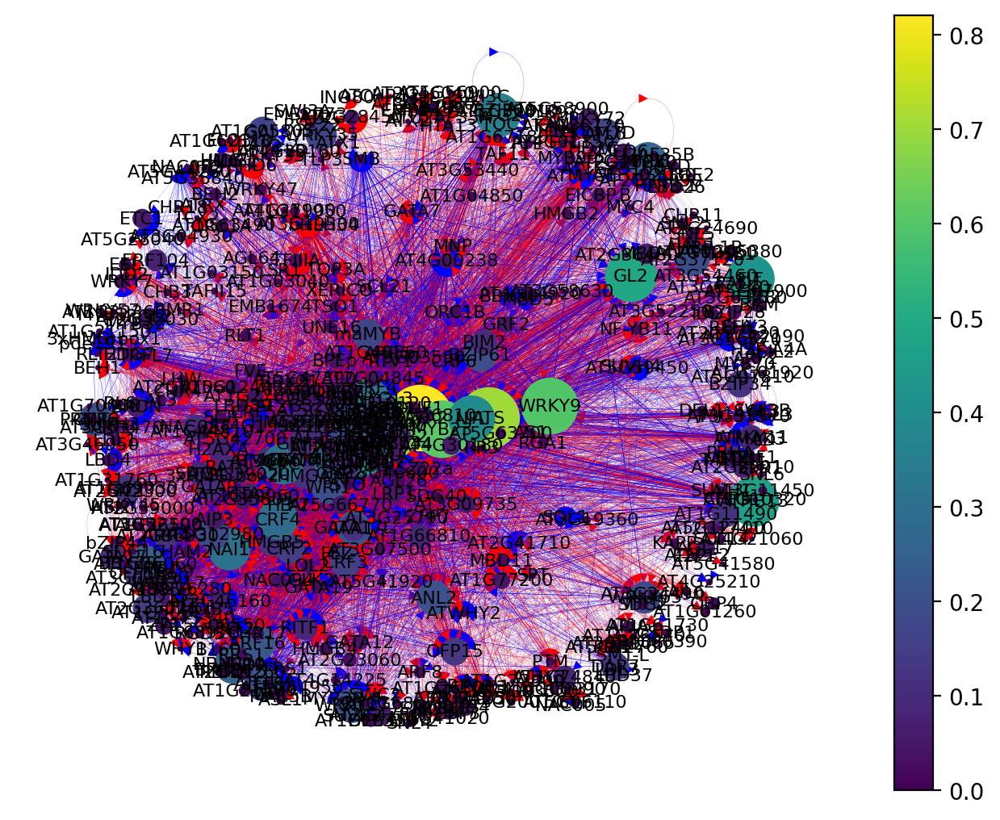

In [19]:
atri = network(0)

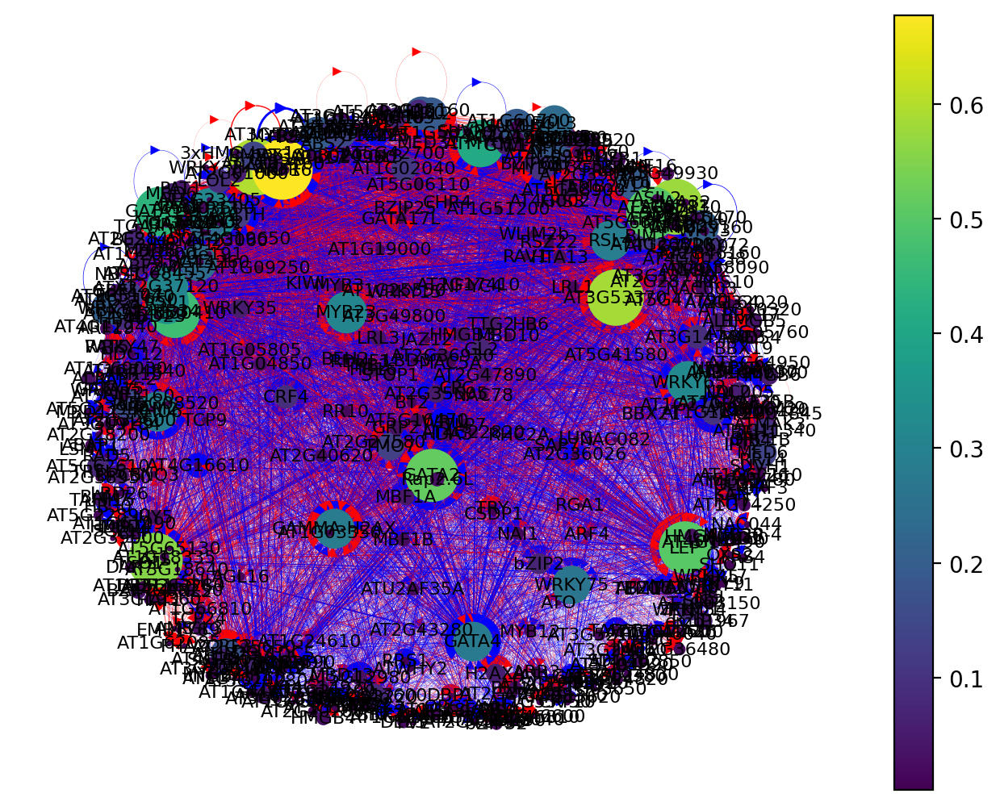

In [20]:
tri = network(1)

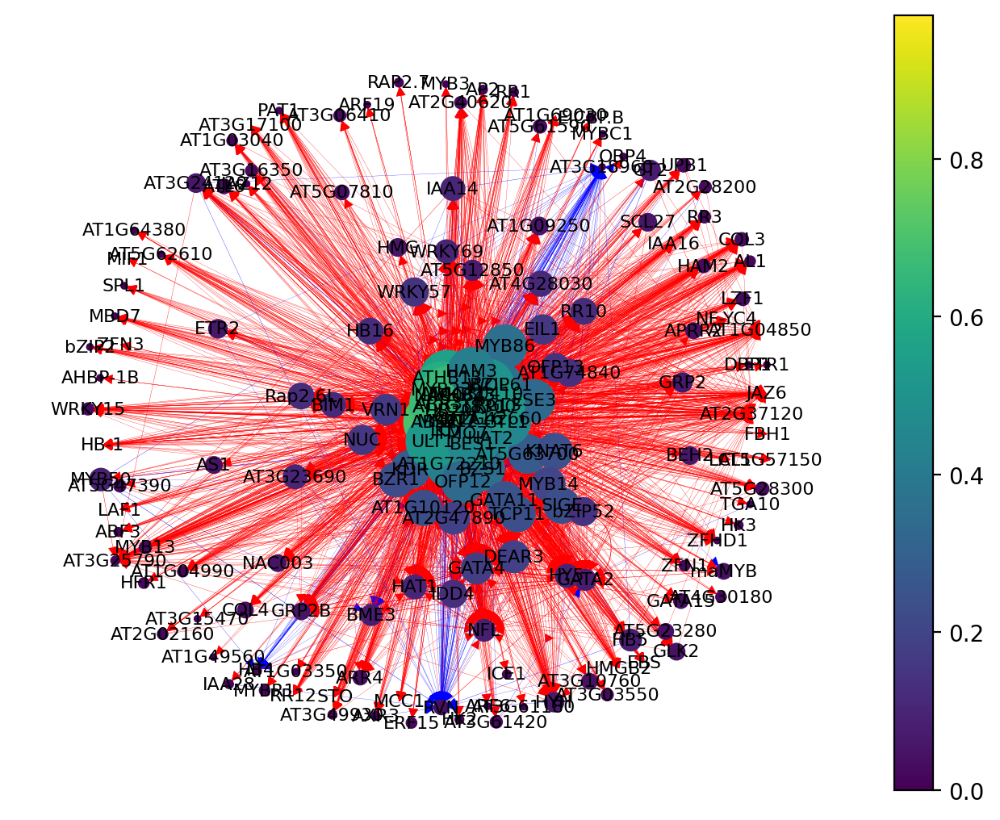

In [21]:
cor = network(2)

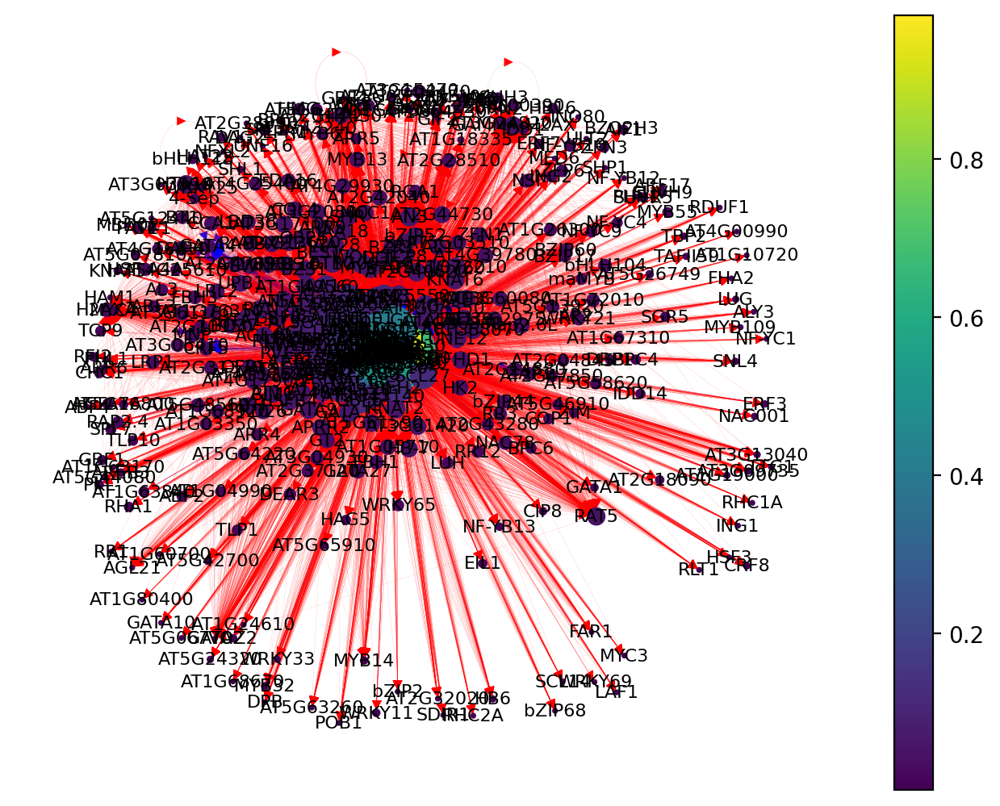

In [22]:
end = network(3)

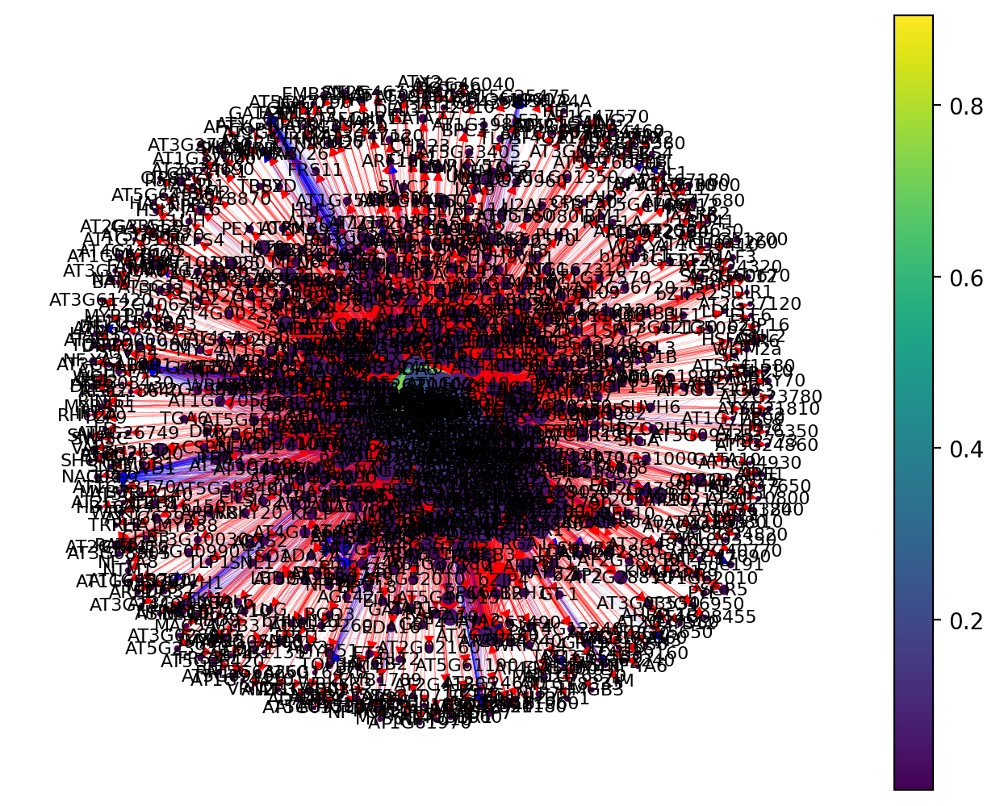

In [23]:
per = network(4)

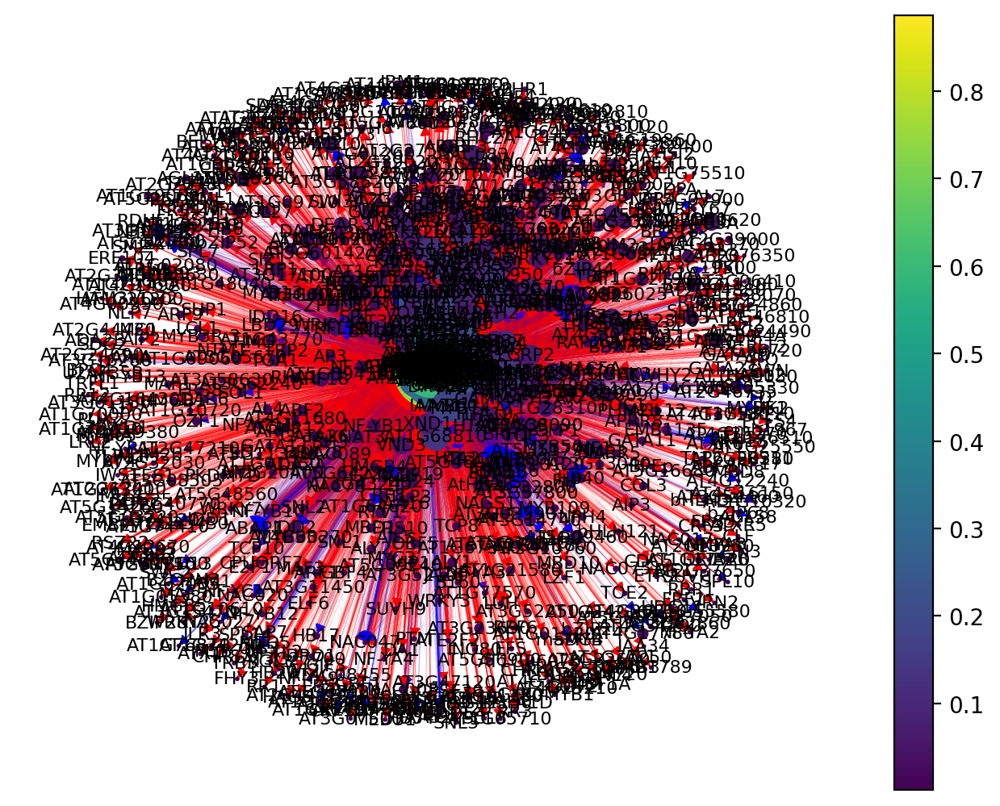

In [24]:
pro = network(5)

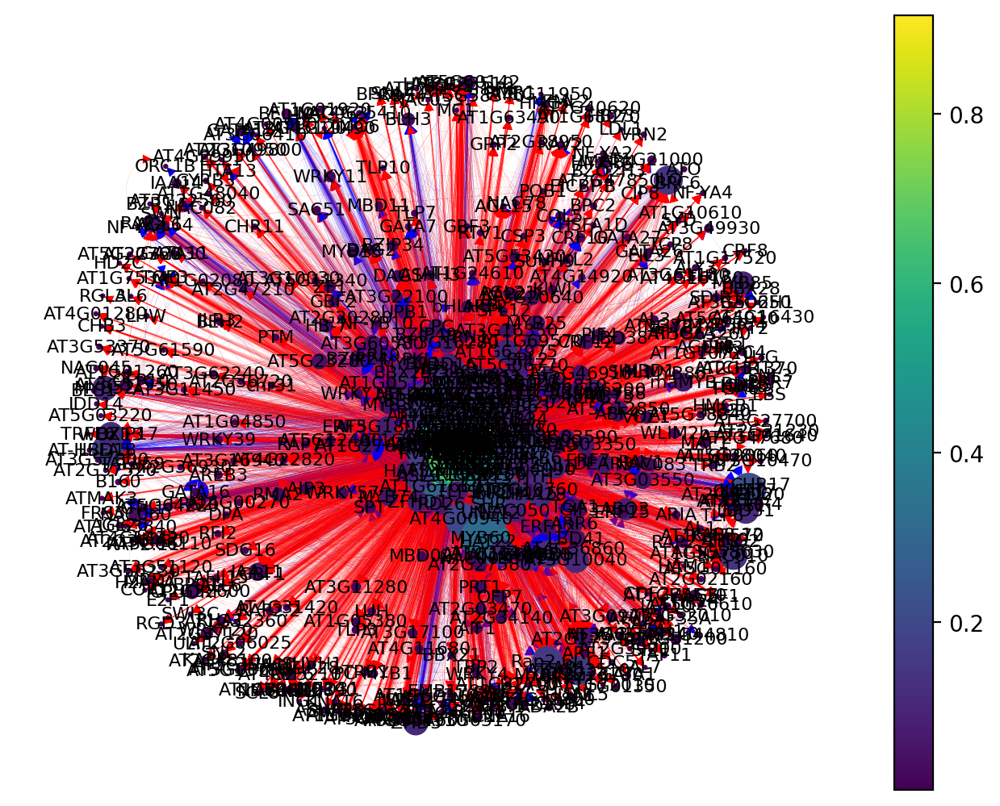

In [25]:
xyl = network(6)

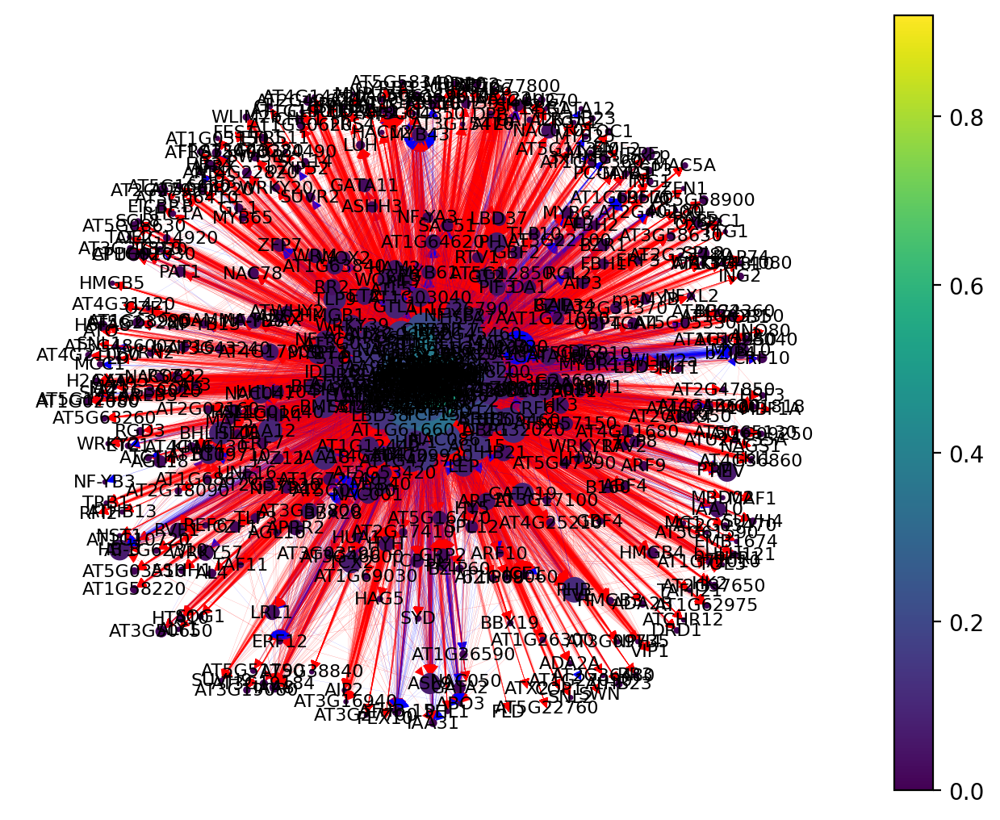

In [26]:
phl = network(7)

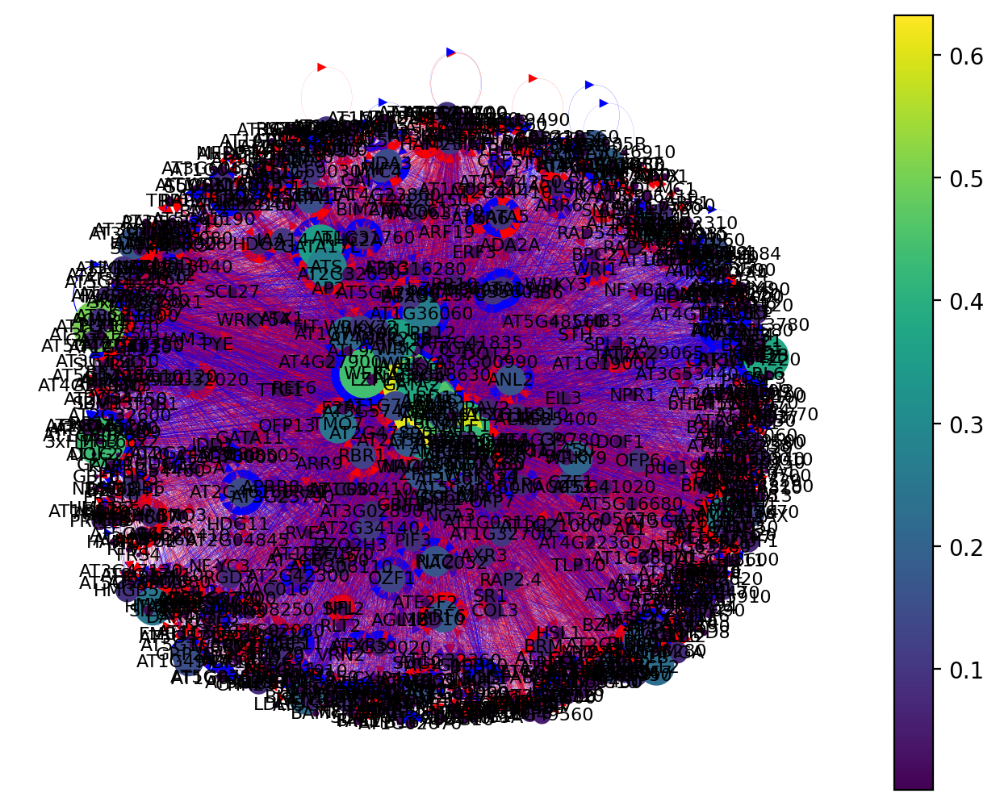

In [27]:
lrc = network(8)

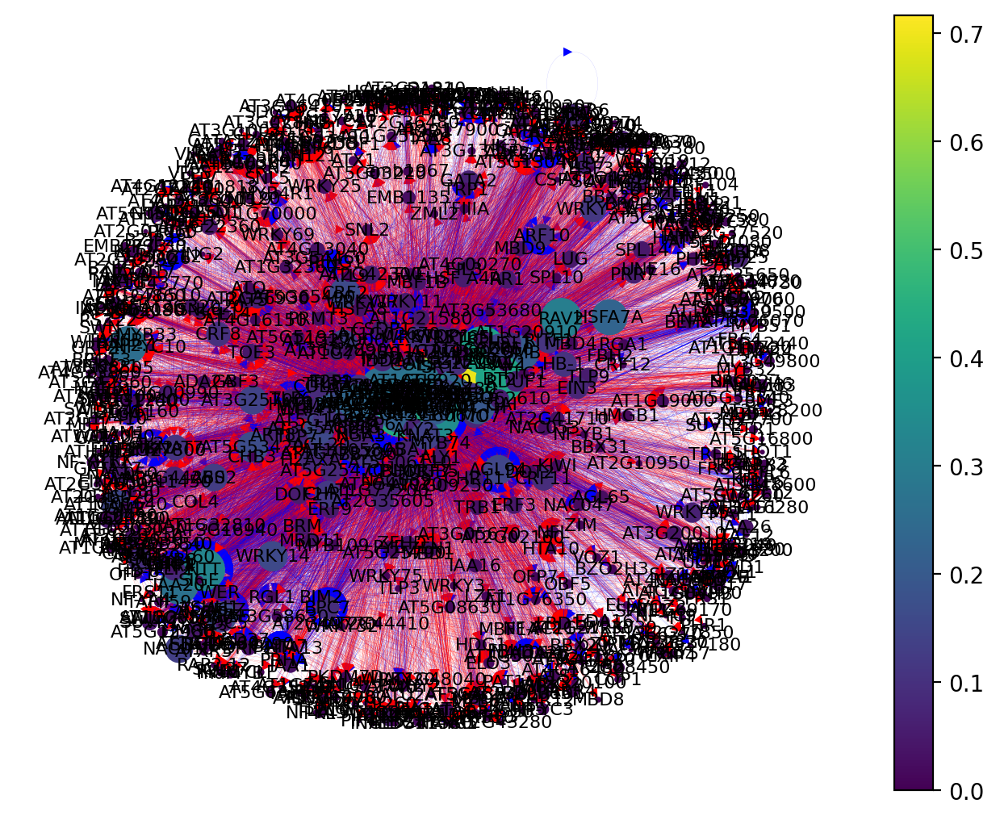

In [28]:
col = network(9)

In [29]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [30]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [31]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
ATS,0.723999,0.808652,0.190379,0.702532,0.555556,0.279898,0.107595,0.163522,0.136132,9,12.668265
WRKY9,0.711599,0.902908,0.024147,0.597046,0.207547,0.208651,0.054852,0.511530,0.020356,9,12.238638
WRKY72,0.875385,0.977688,0.000075,0.069620,0.100629,0.104326,0.122363,0.723270,0.033079,9,12.006434
WRI1,0.944068,0.928228,0.280055,0.196203,0.016771,0.034351,0.236287,0.207547,0.109415,9,11.952926
OFP15,0.889216,0.005483,0.555532,0.128692,0.010482,0.036896,0.156118,0.090147,0.096692,9,10.969258
WRKY27,0.441727,0.786569,0.001702,0.208861,0.020964,0.086514,0.061181,0.140461,0.055980,9,10.803959
GATA17,0.043519,0.327410,0.202125,0.105485,0.020964,0.147583,0.377637,0.220126,0.085242,9,10.530090
AT5G12980,0.259132,0.001462,0.122789,0.181435,0.033543,0.085242,0.059072,0.050314,0.054707,9,9.847696
AT2G36026,0.194659,0.001568,0.014564,0.149789,0.006289,0.064885,0.078059,0.100629,0.038168,9,9.648611


In [32]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
KDR,0.949135,0.922546,0.677215,0.677149,0.683544,0.473795,6,10.383384
ATMYC1,0.163576,0.975882,0.010549,0.408805,0.455696,0.379455,6,8.393963
AGL87,0.657777,0.900186,0.054852,0.044025,0.029536,0.415094,6,8.101471
CRF4,0.696568,0.802120,0.289030,0.090147,0.122363,0.064990,6,8.065217
TRY,0.938118,0.003616,0.267932,0.008386,0.413502,0.039832,6,7.671387
GL2,0.886691,0.020194,0.487342,0.071279,0.156118,0.006289,6,7.627913
RHD6,0.000201,0.798865,0.006329,0.285115,0.164557,0.174004,6,7.429072
AT1G11490,0.012431,0.890831,0.120253,0.100629,0.010549,0.278826,6,7.413519
AT3G53370,0.000004,0.479362,0.025316,0.584906,0.029536,0.213836,6,7.332960
AT2G37120,0.009202,0.283724,0.191983,0.310273,0.018987,0.044025,6,6.858193


In [33]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
NAC044,0.874105,0.046414,0.132911,3,4.053429
TTG2,0.841817,0.354430,0.151899,3,4.348146
BNQ3,0.427418,0.316456,0.048523,3,3.792397
AT1G44810,0.171979,0.033755,0.061181,3,3.266916
HDG7,0.094335,0.029536,0.320675,3,3.444546
REF6,0.054759,0.029536,0.054852,3,3.139147
RSZ22a,0.006276,0.027426,0.082278,3,3.115980
bZIP52,0.002658,0.101266,0.004219,3,3.108144
AGL26,0.000847,0.025316,0.052743,3,3.078907
OFP18,0.000397,0.135021,0.023207,3,3.158625


In [34]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
MYB47,0.929144,0.098532,0.299790,3,4.327467
EGL3,0.833276,0.238994,0.178197,3,4.250467
RSL1,0.813585,0.339623,0.121593,3,4.274800
MBD4,0.775206,0.077568,0.088050,3,3.940824
OFP13,0.743332,0.314465,0.115304,3,4.173101
WRKY75,0.633128,0.264151,0.046122,3,3.943401
ESE3,0.565782,0.498952,0.085954,3,4.150688
AT5G06800,0.303195,0.027254,0.031447,3,3.361895
AT1G02030,0.126993,0.018868,0.010482,3,3.156343
MBF1A,0.075692,0.041929,0.029350,3,3.146971


In [35]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
PS1,0.763114,0.184478,0.157761,3,4.105353
WRKY7,0.697755,0.052163,0.123410,3,3.873328
GATA6,0.691802,0.035623,0.131043,3,3.858469
AT1G63100,0.668996,0.034351,0.209924,3,3.913270
CHR24,0.517210,0.052163,0.041985,3,3.611358
DEL3,0.504674,0.089059,0.050891,3,3.644623
AT5G66770,0.423476,0.026718,0.049618,3,3.499812
HDG2,0.309682,0.062341,0.085242,3,3.457265
WRI4,0.253818,0.038168,0.067430,3,3.359416
ATXR5,0.229200,0.026718,0.055980,3,3.311898


In [36]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
AT3G60670,0.991713,0.345833,0.659722,3,4.997269
IAA20,0.990396,0.268056,0.359722,3,4.618173
RING1,0.984112,0.006944,0.390278,3,4.381334
TRFL3,0.951739,0.052778,0.152778,3,4.157294
NTT,0.951281,0.326389,0.222222,3,4.499892
MAF5,0.950325,0.215278,0.202778,3,4.368380
NAC016,0.919952,0.236111,0.154167,3,4.310230
AT5G25470,0.848657,0.080556,0.097222,3,4.026435
BPC7,0.843063,0.093056,0.245833,3,4.181952
AT2G35910,0.750612,0.219444,0.044444,3,4.014501


In [37]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
ARR3,0.006024,0.000081,0.668675,0.909091,0.319277,0.028571,6,7.931719
OFP12,0.063381,0.000277,0.331325,0.088312,0.018072,0.005195,6,6.506562


In [38]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
MYB86,0.631508,0.355422,0.144578,3,4.131508
RVN,0.068273,0.036145,0.295181,3,3.399598
SIGE,0.016502,0.234940,0.240964,3,3.492406
AT2G38300,0.010624,0.674699,0.277108,3,3.962432
AT2G42660,0.005988,0.500000,0.349398,3,3.855385
WRKY69,0.005769,0.096386,0.204819,3,3.306973
AT3G61420,0.003980,0.024096,0.066265,3,3.094341
AT1G09250,0.000183,0.054217,0.120482,3,3.174881
ETR2,0.000073,0.060241,0.078313,3,3.138627


In [39]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
MYB68,0.983543,0.966234,0.189610,3,5.139387
SCR,0.153571,0.792208,0.057143,3,4.002922
MYB36,0.090321,0.981818,0.394805,3,4.466944
BLJ,0.072423,0.883117,0.002597,3,3.958137
RAX2,0.036648,0.922078,0.054545,3,4.013271
AT2G43140,0.028233,0.090909,0.057143,3,3.176285
BIB,0.018419,0.501299,0.075325,3,3.595042
SOM,0.015774,0.854545,0.540260,3,4.410579
AT4G16430,0.005093,0.015584,0.088312,3,3.108989
SUVR5,0.002496,0.012987,0.075325,3,3.090808


In [40]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G43430,0.303823,0.799071,0.875056,0.925392,0.904659,0.874142,0.271795,0.835206,0.926327,0.763158,0.165812,0.410112,12,20.054553
MYB20,0.969625,0.989885,0.961050,0.923376,0.861322,0.835240,0.651282,0.044944,0.709642,0.207094,0.211966,0.458801,12,19.824227
BT1,0.736807,0.245415,0.927435,0.751470,0.302275,0.721968,0.695726,0.061798,0.084507,0.094966,0.153846,0.123596,12,16.899809
DAG1,0.924889,0.157642,0.000032,0.852615,0.393283,0.764302,0.020513,0.704120,0.291441,0.390160,0.148718,0.147940,12,16.795655
AT4G24060,0.030895,0.155614,0.919804,0.888406,0.215601,0.581236,0.218803,0.237828,0.302275,0.139588,0.148718,0.222846,12,16.061616
IAA12,0.003116,0.994485,0.984446,0.129498,0.013001,0.612128,0.692308,0.095506,0.062839,0.161327,0.121368,0.073034,12,15.943055
AT5G50010,0.117020,0.968201,0.869772,0.045130,0.132178,0.356979,0.437607,0.069288,0.080173,0.176201,0.102564,0.050562,12,15.405676
IAA13,0.003287,0.124392,0.007792,0.899003,0.109426,0.474828,0.160684,0.544944,0.254605,0.231121,0.225641,0.273408,12,15.309130
AT1G69580,0.001236,0.026561,0.013061,0.861757,0.086674,0.429062,0.210256,0.563670,0.218852,0.110984,0.200000,0.209738,12,14.931850
AT2G29660,0.001078,0.840523,0.062458,0.869574,0.084507,0.236842,0.194872,0.222846,0.044420,0.054920,0.129915,0.059925,12,14.801880


In [41]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT3G21330,0.957091,0.096425,0.216685,3,4.270200
AT4G20970,0.478950,0.071506,0.108342,3,3.658798
MGP,0.211395,0.176598,0.042254,3,3.430246
AT2G20100,0.119665,0.231853,0.199350,3,3.550868
MYBC1,0.086822,0.732394,0.645720,3,4.464937
GATA23,0.026388,0.104009,0.412784,3,3.543181
IDD11,0.013838,0.264355,0.123510,3,3.401703
ERF10,0.007827,0.046587,0.120260,3,3.174674
NUC,0.006470,0.242687,0.247021,3,3.496177
bZIP4,0.004337,0.037920,0.191766,3,3.234023


In [42]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
AT3G04850,0.990894,0.086957,0.252860,3,4.330711
HB18,0.954341,0.132723,0.149886,3,4.236950
AT1G75490,0.854318,0.268879,0.156751,3,4.279947
AT4G32800,0.640785,0.020595,0.052632,3,3.714011
NAC080,0.469565,0.254005,0.035469,3,3.759039
WRKY26,0.243053,0.062929,0.069794,3,3.375776
HB24,0.029516,0.025172,0.027460,3,3.082148
BBX18,0.007118,0.002288,0.043478,3,3.052885
AT2G24680,0.003119,0.001144,0.030892,3,3.035156
IDD2,0.002056,0.021739,0.085812,3,3.109608


In [43]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
TCP10,0.994152,0.297436,0.234188,3,4.525776
VND6,0.991356,0.126496,0.229060,3,4.346912
AT1G26610,0.980570,0.225641,0.135043,3,4.341254
MYB46,0.976780,0.319658,0.211966,3,4.508404
VND1,0.974602,0.716239,0.157265,3,4.848106
...,...,...,...,...,...
AT1G03350,0.000088,0.054701,0.102564,3,3.157353
AT3G19080,0.000035,0.123077,0.039316,3,3.162428
MAF1,0.000023,0.015385,0.046154,3,3.061562
AT3G49930,0.000003,0.010256,0.035897,3,3.046157


In [44]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
APL,0.915639,0.919476,0.217228,3,5.052343
AT4G37180,0.852422,0.823970,0.144195,3,4.820587
AT3G12730,0.823794,0.861423,0.084270,3,4.769487
AT1G49560,0.821043,0.518727,0.091760,3,4.431530
REM22,0.792774,0.224719,0.074906,3,4.092400
CRF1,0.753845,0.297753,0.054307,3,4.105905
DAR2,0.676086,0.837079,0.029963,3,4.543127
HCA2,0.668613,0.696629,0.668539,3,5.033782
AT2G03500,0.664039,0.848315,0.035581,3,4.547934
NAC020,0.582935,0.591760,0.801498,3,4.976193


## Search for individual genes

In [45]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality,per_degree_centrality,per_out_centrality,per_in_centrality,per_betweenness_centrality,...,pro_out_centrality,pro_in_centrality,pro_closeness_centrality,pro_eigenvector_centrality,xyl_degree_centrality,xyl_out_centrality,xyl_in_centrality,xyl_betweenness_centrality,xyl_closeness_centrality,xyl_eigenvector_centrality
SHR,2.0,0.415584,0.044156,0.371429,0.001088,0.077031,0.280607,0.12026,0.160347,0.002945,...,0.018307,0.08238,0.000571,0.028845,0.198291,0.155556,0.042735,0.800167,0.000618,0.041595


In [46]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,1.0,0.885714,0.883117,0.002597,0.072423,0.000995,0.121123


In [47]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
JKD,2.0,0.223629,0.2173,0.006329,0.058487,0.001407,0.071245,0.807229,0.716867,0.090361,0.025265,0.000406,0.147346,0.753247,0.633766,0.119481,0.000862,0.110045


In [48]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_closeness_centrality,atri_eigenvector_centrality,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
RVN,1.0,0.111814,0.111814,0.001211,0.044502,0.331325,0.036145,0.295181,0.068273,0.000349,0.084418,0.106494,0.057143,0.049351,0.00056,0.033328


In [49]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,1.0,0.576623,0.501299,0.075325,0.018419,0.000829,0.09155


In [50]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [51]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [52]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,tri_betweenness_centrality,tri_closeness_centrality,tri_eigenvector_centrality,lrc_degree_centrality,lrc_out_centrality,lrc_in_centrality,lrc_closeness_centrality,lrc_eigenvector_centrality
GL2,2.0,0.64346,0.487342,0.156118,0.886691,0.001437,0.121985,0.077568,0.071279,0.006289,0.020194,0.000956,0.037504,0.026718,0.001272,0.025445,0.000548,0.014532


In [53]:
tf_spec.to_csv('TF_GRN_centrality_t1-t3_zscore3.csv', index=True)